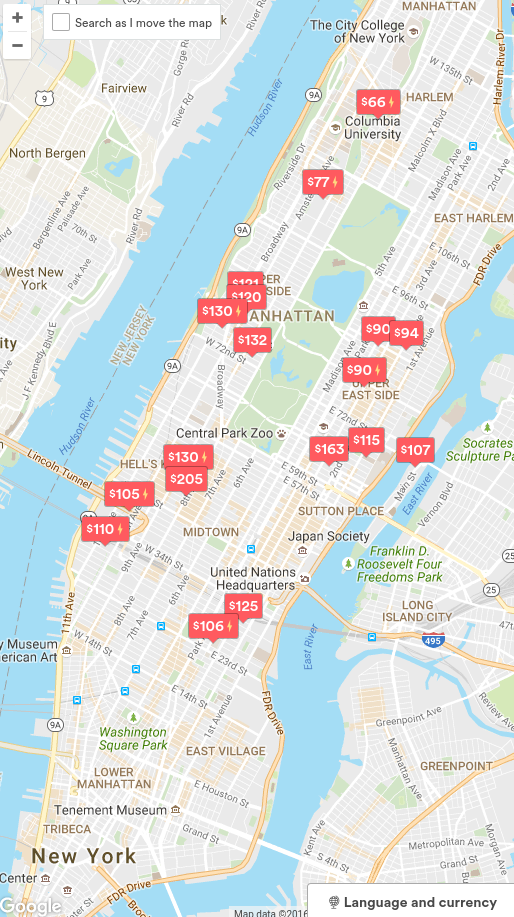

In [165]:
from IPython.display import Image
Image(filename='/home/mdesnoyer/Pictures/airbnb_nyc_search.png')

In [184]:
%matplotlib inline
import glob
import json
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import os.path
import pandas as pd
from PIL import Image
import sklearn
import scipy.spatial
import scipy.stats

In [14]:
def prep_image_feature_data(data): 
    data.columns = [int(x.partition('.')[0]) for x in data.columns]
    data = data.T
    data.index.name = 'image_id'
    return data

In [30]:
def prep_metadata(json_dir):
    image_data = {}
    price_data = {}
    for fn in glob.iglob(os.path.join(json_dir, '*.json')):
        with open(fn) as f:
            data = json.load(f)
            listing_id = data['slideshow_props']['listing']['id']
            price_data[listing_id] = data['pricing']['pricing_quote']['p3_display_rate']['amount']
            for photo in data['slideshow_props']['photos']:
                image_data[photo['id']] = {'listing_id' : listing_id, 'rank': photo['sort_order']}
                
    image_data = pd.DataFrame(image_data).T
    price_data = pd.Series(price_data, name='price')
    return image_data.join(price_data, 'listing_id')

In [36]:
weights = pd.read_pickle('/home/mdesnoyer/src/neon3/model/demographics/20160713-aquilav2-weight.pkl')
bias = pd.read_pickle('/home/mdesnoyer/src/neon3/model/demographics/20160713-aquilav2-bias.pkl')
def compute_score_for_demo(X, gender='None', age='None'):
    '''Returns the score for gender `gender` and age `age` derived from
    feature vector X (a numpy array)
    '''

    b = bias[gender, age][0]
    W = weights[gender, age]
    try:
        scores = W.dot(X) + b
    except ValueError as e:
        raise ValueError(e)
    # return score
    # for now, we're nto going to return the score as multiindex 
    # series objects, but simply as floats.
    return scores

In [47]:
image_features = pd.read_pickle('/data/neon/airbnb/nyc_1bdrm_images.pkl')
image_features = prep_image_feature_data(image_features)
image_metadata = prep_metadata('/data/neon/airbnb/nyc_1bdrm')
image_metadata.index.name = 'image_id'

In [55]:
data = image_metadata.copy()
data['scores'] = compute_score_for_demo(image_features.T)
data = data.set_index(['listing_id', 'rank'], append=True).reorder_levels([1,2,0]).sort_index()

(0, 300)

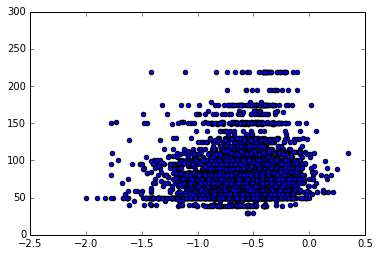

In [72]:
# Correlation of all images with price
plt.scatter(data['scores'], data['price'])
scipy.stats.spearmanr(data['scores'], data['price'])
plt.ylim((0, 300))

(0.03258578996533374, 0.57398278204120601)

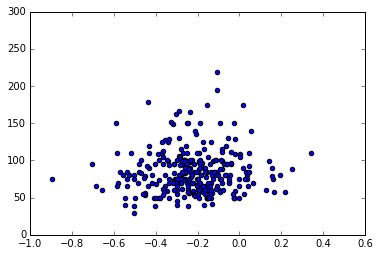

In [73]:
# Correlation of the highest valence image for each listing with price
best_images = data.groupby(level='listing_id').max()
plt.scatter(best_images['scores'], best_images['price'])
plt.ylim((0, 300))
scipy.stats.spearmanr(best_images['scores'], best_images['price'])

(0.16887364890297429, 0.0034557798027430413)

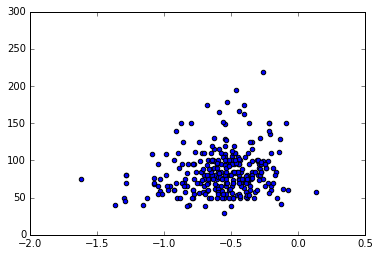

In [74]:
# Correlation of the hero images with price
hero_images = data.loc[(slice(None), 1, slice(None)), :]
plt.scatter(hero_images['scores'], hero_images['price'])
plt.ylim((0, 300))
scipy.stats.spearmanr(hero_images['scores'], hero_images['price'])

(0.15672511468416783, 0.0065271021819670542)

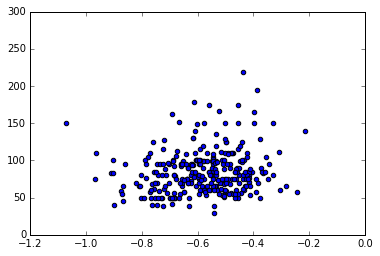

In [76]:
# Correlation of the mean valence score of the images in each listing with price
mean_scores = data.groupby(level='listing_id').mean()
plt.scatter(mean_scores['scores'], mean_scores['price'])
plt.ylim((0, 300))
scipy.stats.spearmanr(mean_scores['scores'], mean_scores['price'])

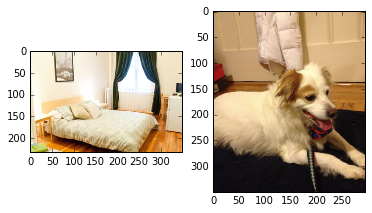

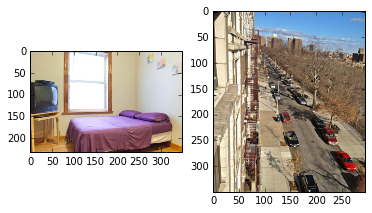

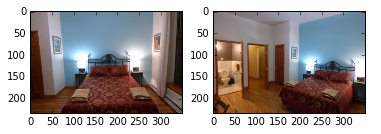

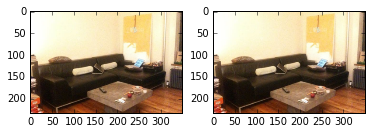

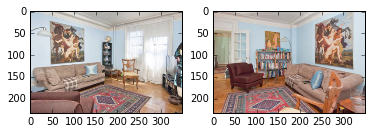

...

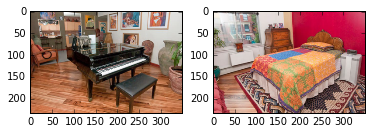

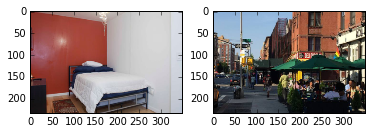

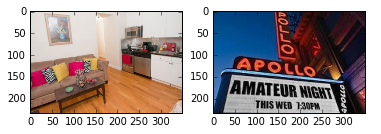

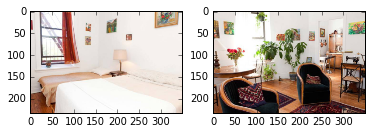

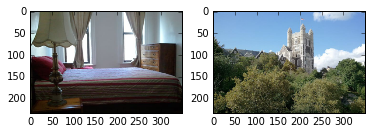

In [96]:
# Display some examples of hero images (left) and the highest scored images (right) for random properties
IMAGE_DIR='/data/neon/airbnb/nyc_1bdrm_images'
IMSIZE=350

best_image_ids = data.groupby(level='listing_id')['scores'].apply(lambda x: np.argmax(x)[2])
hero_image_ids = data.loc[(slice(None), 1, slice(None)), :].reset_index(['rank', 'image_id'])['image_id']
image_ids = pd.concat([best_image_ids, hero_image_ids], axis=1)
image_ids.columns=['best_image', 'hero_image']
fig_num = 0
for idx, row in image_ids.iterrows():
    best_image = Image.open(os.path.join(IMAGE_DIR, '%i.jpg' % row['best_image']))
    best_image.thumbnail((IMSIZE, IMSIZE))
    hero_image = Image.open(os.path.join(IMAGE_DIR, '%i.jpg' % row['hero_image']))
    hero_image.thumbnail((IMSIZE, IMSIZE))
    plt.figure(fig_num)
    plt.subplot(121)
    plt.imshow(hero_image)
    plt.subplot(122)
    plt.imshow(best_image)
    fig_num +=1
    if fig_num > 15:
        break

In [214]:
def plot_images(fig, data, n_images=10, imsize=70, base_dir='/data/neon/airbnb/nyc_1bdrm_images'):
    data_sample = data.sample(n_images, axis=0)
    for i, row in data_sample.iterrows():
        try:
            im = Image.open(os.path.join(base_dir, os.path.join(base_dir, '%i.jpg' % i)))
        
            im.thumbnail((imsize, imsize))
        except IOError:
            continue
        imbox = OffsetImage(im)
        fig.get_axes()[0].add_artist(AnnotationBbox(imbox, row[:2], xycoords='data', frameon=False,
                                                    pad=0.0, box_alignment=(0.5, 0.5)))

In [112]:
def plot_images_evenly_in_space(features, base_dir=None):
    '''Plot the images to show so that we have roughly one in the middle of each grid cell'''
    fig = plt.figure(1, (15.0, 10.))
    plt.scatter(features.iloc[:,0], features.iloc[:,1])
    lim = fig.get_axes()[0].viewLim
    
    xrange = np.linspace(lim.xmin, lim.xmax, 24)
    yrange = np.linspace(lim.ymin, lim.ymax, 20)
    selected_features = []
    for x1, x2 in zip(xrange[:-1], xrange[1:]):
        for y1, y2 in zip(yrange[:-1], yrange[1:]):
            images_in_cell = ((features.iloc[:,0] > x1) & (features.iloc[:,0] < x2) & 
                              (features.iloc[:,1] > y1) & (features.iloc[:,1] < y2))
            images_in_cell = features.ix[images_in_cell]
            if images_in_cell.shape[0] == 0:
                continue
            selected_features.append(((images_in_cell.iloc[:,0] - ((x2+x1)/2)).abs() + 
                                      (images_in_cell.iloc[:,1] - (y1+y2)/2).abs()).argmin())
    images_to_show = features.ix[selected_features]
    plot_images(fig, images_to_show, n_images=images_to_show.shape[0], base_dir=base_dir)

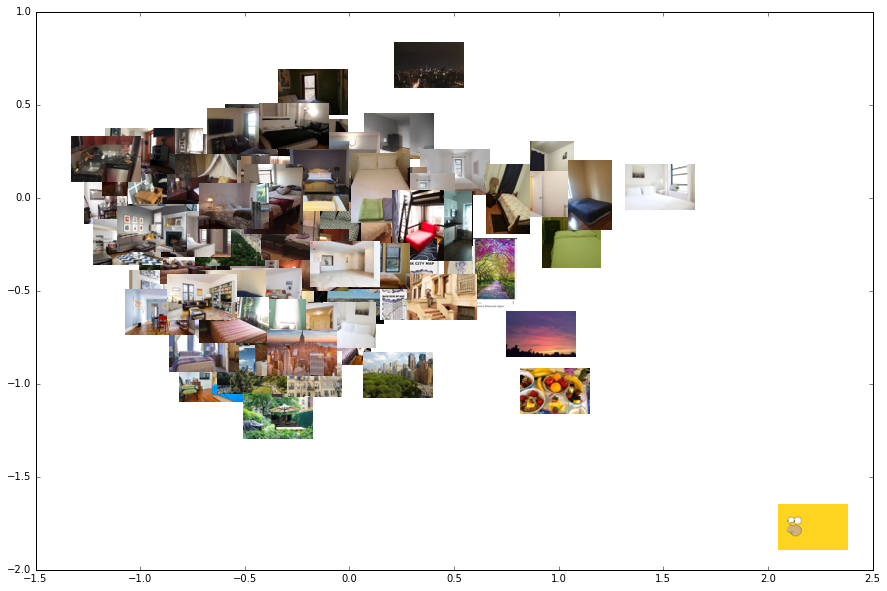

In [206]:
# Show the feature shape of hero images
hero_features = image_features.ix[hero_image_ids]
plot_images_evenly_in_space(hero_features.ix[:,1:])


In [146]:
def get_colors(data, cmap='jet'):
    data = data.astype(np.float32) - data.min()
    data = data / 100
    cmap = cm.get_cmap(cmap)
    return cmap(data)

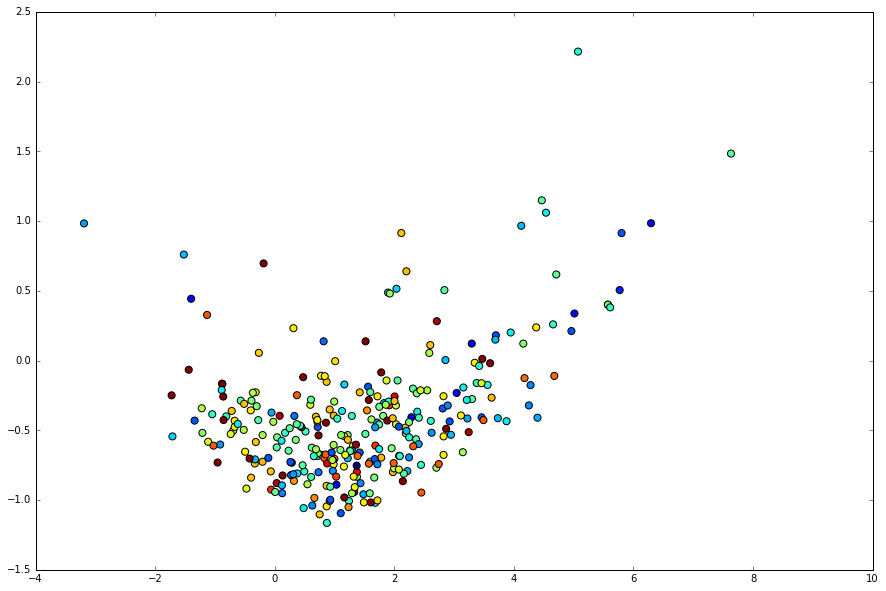

In [151]:
# Plot all the hero images in the valence space and color by price
prices = image_metadata['price'][hero_features.index]
fig = plt.figure(1, (15.0, 10.))
plt.scatter(hero_features.ix[:,0], hero_features.ix[:,1], c=get_colors(prices), s=50.)

(array([  1.,   8.,  23.,  38.,  37.,  31.,  39.,  37.,  28.,  20.,   7.,
          5.,   5.,   2.,   8.,   0.,   3.,   2.,   1.,   1.]),
 array([  29. ,   37.3,   45.6,   53.9,   62.2,   70.5,   78.8,   87.1,
          95.4,  103.7,  112. ,  120.3,  128.6,  136.9,  145.2,  153.5,
         161.8,  170.1,  178.4,  186.7,  195. ]),
 <a list of 20 Patch objects>)

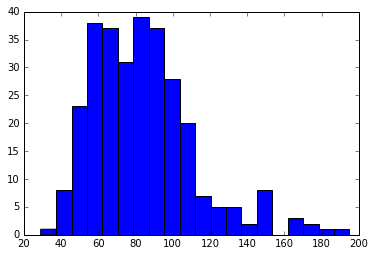

In [155]:
# Histogram of prices
plt.hist(prices[prices < 200], 20)

(array([   1.,    1.,    6.,    3.,   14.,    4.,   17.,   33.,   33.,
          38.,   67.,   92.,  127.,  153.,  226.,  302.,  382.,  473.,
         584.,  565.,  576.,  404.,  310.,  164.,   73.,   29.,   11.,
           9.,    3.,    1.]),
 array([-1.99775611, -1.91971213, -1.84166814, -1.76362415, -1.68558017,
        -1.60753618, -1.5294922 , -1.45144821, -1.37340423, -1.29536024,
        -1.21731625, -1.13927227, -1.06122828, -0.9831843 , -0.90514031,
        -0.82709632, -0.74905234, -0.67100835, -0.59296437, -0.51492038,
        -0.4368764 , -0.35883241, -0.28078842, -0.20274444, -0.12470045,
        -0.04665647,  0.03138752,  0.10943151,  0.18747549,  0.26551948,
         0.34356346]),
 <a list of 30 Patch objects>)

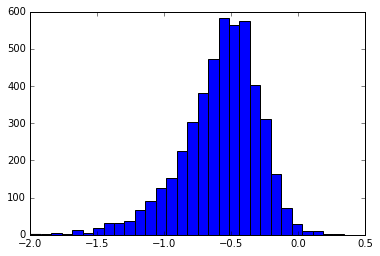

In [164]:
# Histogram of valence scores
plt.hist(data['scores'].fillna(0.0), 30)

In [188]:
nicole_features = pd.read_pickle('/data/neon/airbnb/nicole_images.pkl')
nicole_features = nicole_features.T

In [175]:
def rank_images(corpus, query):
    dists = pd.DataFrame(scipy.spatial.distance.cdist(corpus, query), index=corpus.index,
                         columns=query.index)
    rank = dists.min(axis=1)
    return rank

In [182]:
def show_images(scores, base_dir='/data/neon/airbnb/nyc_1bdrm_images/'):
    '''Show top images from descending scores. The index will get me to the filename'''
    scores = scores.sort_values(ascending=True)
    
    fig = plt.figure(2, (20,16))
    grid = ImageGrid(fig, 111, nrows_ncols=(4, 5))
    i = 0
    for row in scores.index.tolist():
        im = Image.open(os.path.join(base_dir, '%s.jpg' % row))
        im.thumbnail((200, 200))
        grid[i].imshow(im)
        grid[i].set_xlim(0., 200.)
        grid[i].set_ylim(200., 0.)
        grid[i].axes.get_xaxis().set_ticks([])
        grid[i].axes.get_yaxis().set_ticks([])
        i += 1
        if i >= 20:
            break
    plt.show()

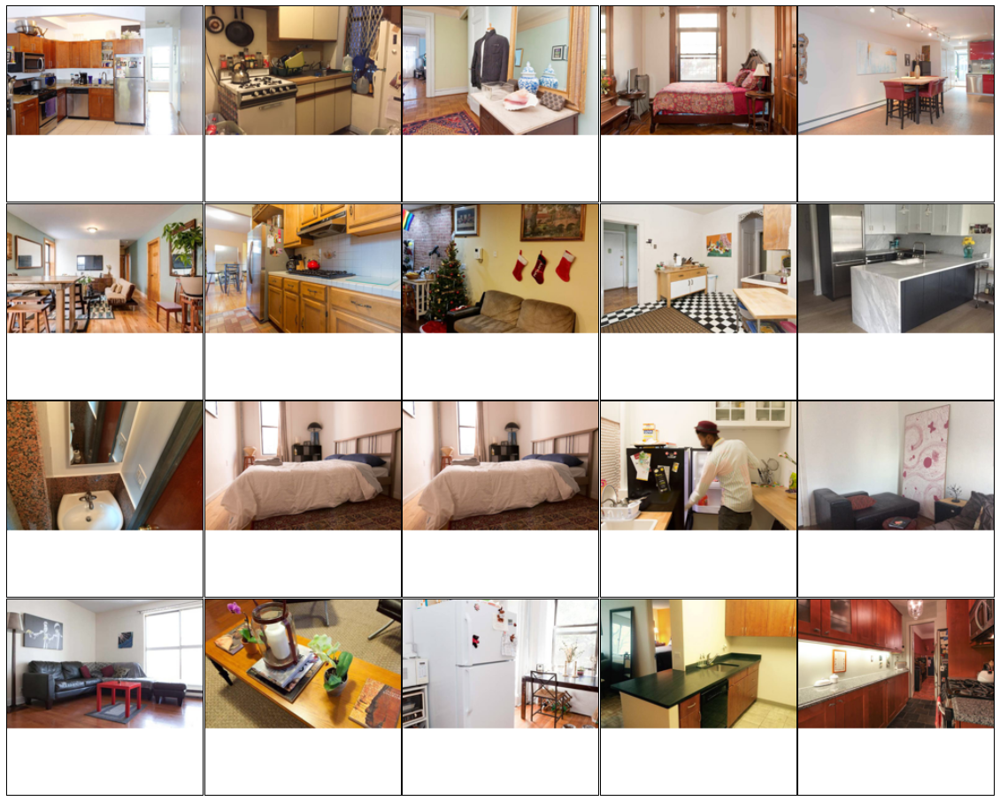

In [189]:
# Nicole's recommendataions
ranks = rank_images(image_features, nicole_features)
show_images(ranks)

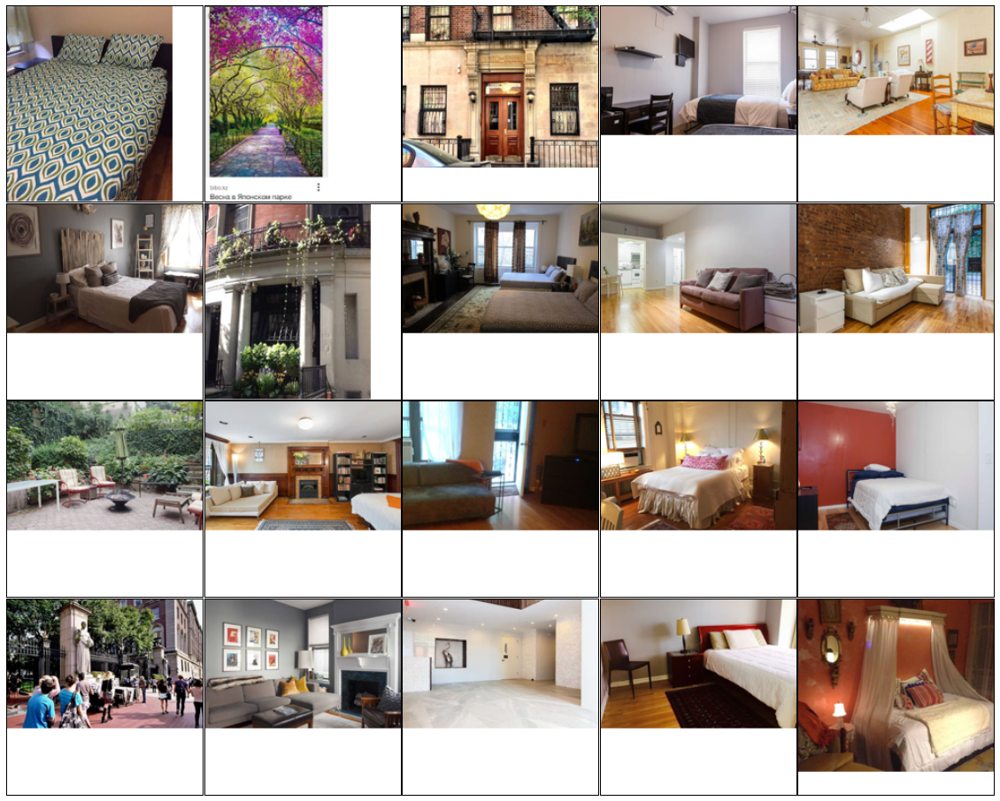

In [201]:
# Highest price listings
show_images(-hero_images['price'].reset_index(['listing_id', 'rank'], drop=True))

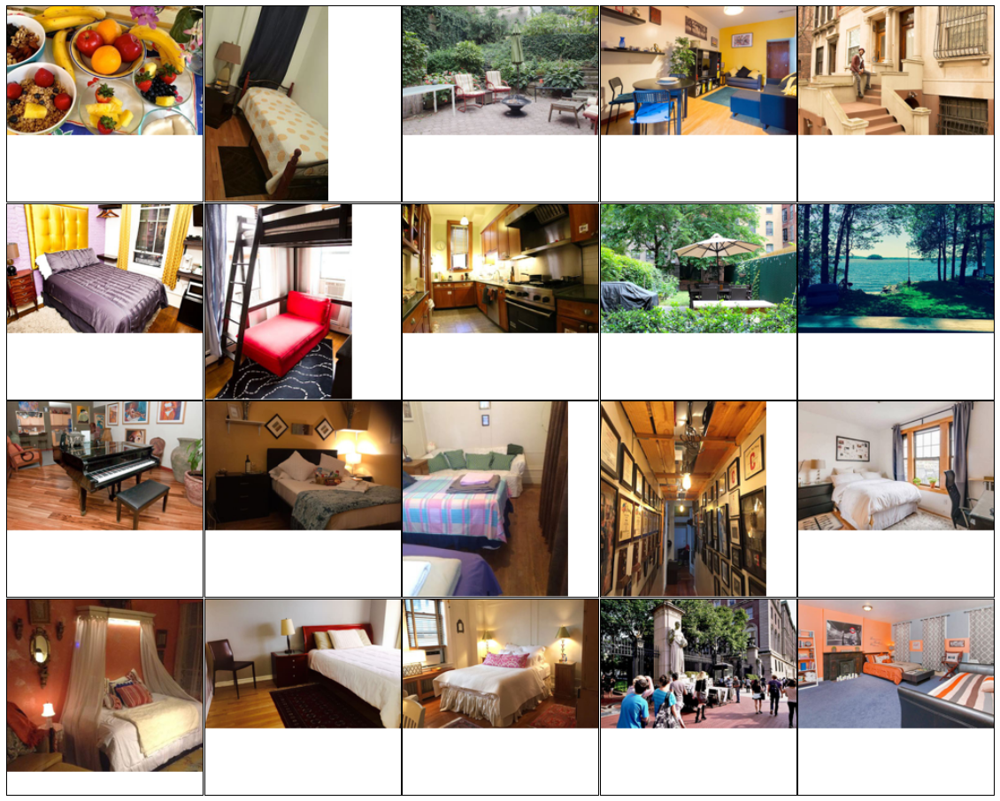

In [204]:
# Highest valence listings
show_images(-hero_images['scores'].reset_index(['listing_id', 'rank'], drop=True))

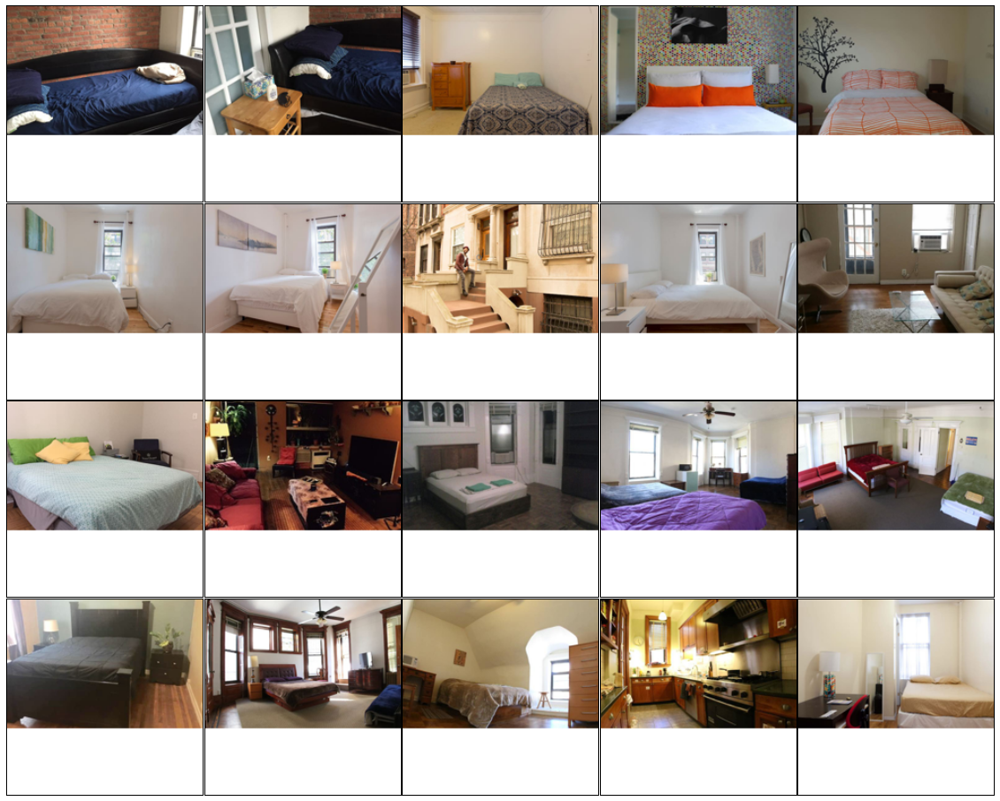

In [202]:
# Lowest price listings
show_images(hero_images['price'].reset_index(['listing_id', 'rank'], drop=True))

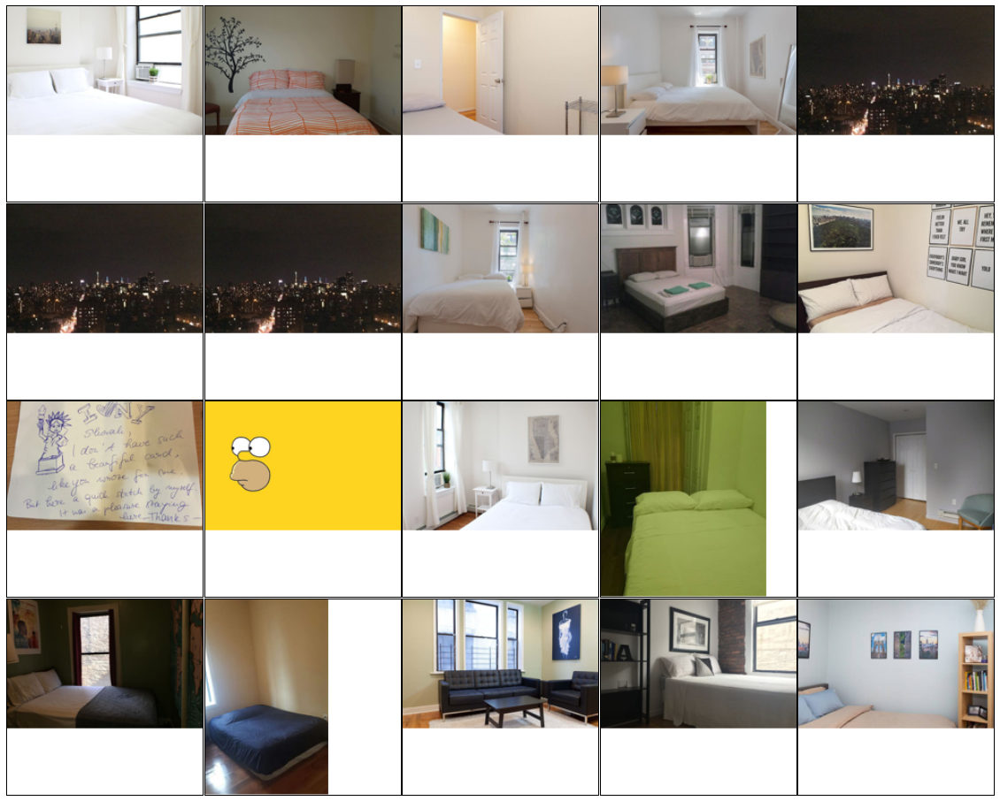

In [205]:
# Lowest valence listings
show_images(hero_images['scores'].reset_index(['listing_id', 'rank'], drop=True))

In [211]:
cabin_features = pd.read_pickle('/data/neon/airbnb/cabin_images.pkl')
cabin_features = prep_image_feature_data(cabin_features)

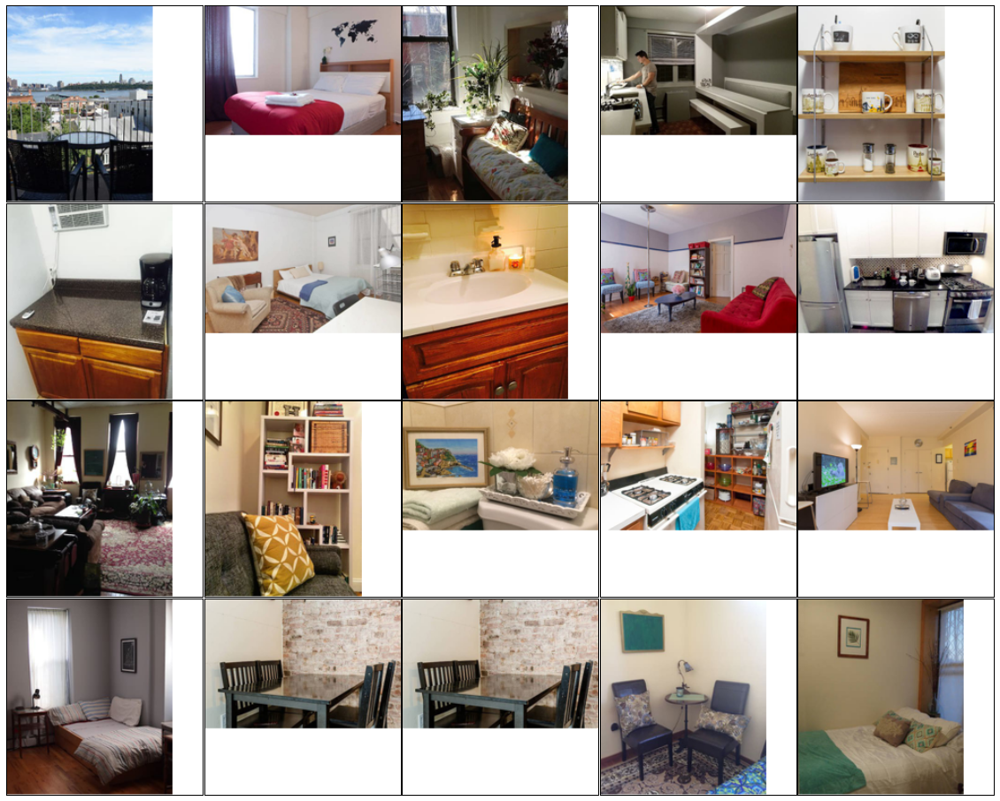

In [212]:
# recommendataions based on the cabin list https://www.airbnb.com/wishlists/best-cabin-getaways
ranks = rank_images(image_features, cabin_features)
show_images(ranks)

In [210]:
paris_features = pd.read_pickle('/data/neon/airbnb/paris_images.pkl')
paris_features = prep_image_feature_data(paris_features)

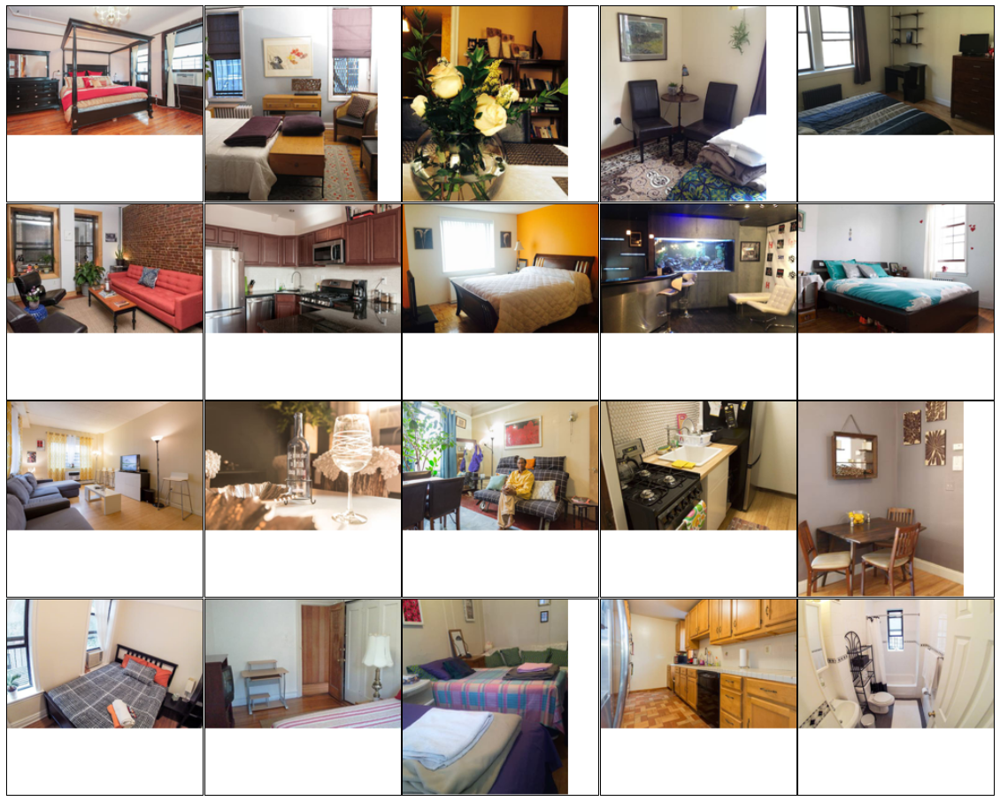

In [213]:
# recommendataions based on the paris list https://www.airbnb.com/wishlists/perfect-paris-getaways
ranks = rank_images(image_features, paris_features)
show_images(ranks)